<a href="https://colab.research.google.com/github/Ari-Net/ISPPR-2/blob/master/Lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Підключаємо бібліотеки

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np 
!pip install tensorflow-addons
import tensorflow_addons as tfa

     |████████████████████████████████| 706kB 7.6MB/s 


# Завантажуємо набір даних "Chest-xray-pneumonia"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train_path='/content/drive/MyDrive/dataset/train/'
valid_path='/content/drive/MyDrive/dataset/val/'
test_path='/content/drive/MyDrive/dataset/test/'
batch_size = 16
img_height = 500
img_width = 500
image_gen = ImageDataGenerator(rescale = 1./255, shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True)
test_data_gen = ImageDataGenerator(rescale = 1./255)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Create Image Data Generator for Train Set
image_gen = ImageDataGenerator(
                                  rescale = 1./255,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True,          
                               )
# Create Image Data Generator for Test/Validation Set
test_data_gen = ImageDataGenerator(rescale = 1./255)

In [ ]:
train = image_gen.flow_from_directory(
      train_path,
      target_size=(img_height, img_width),
      color_mode='grayscale',
      class_mode='binary',
      batch_size=batch_size
      )
test = test_data_gen.flow_from_directory(
      test_path,
      target_size=(img_height, img_width),
      color_mode='grayscale',
      shuffle=False, 
#setting shuffle as False just so we can later compare it with predicted values without having indexing problem 
      class_mode='binary',
      batch_size=batch_size
      )
valid = test_data_gen.flow_from_directory(
      valid_path,
      target_size=(img_height, img_width),
      color_mode='grayscale',
      class_mode='binary', 
      batch_size=batch_size
      )

Found 5256 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
Found 16 images belonging to 2 classes.


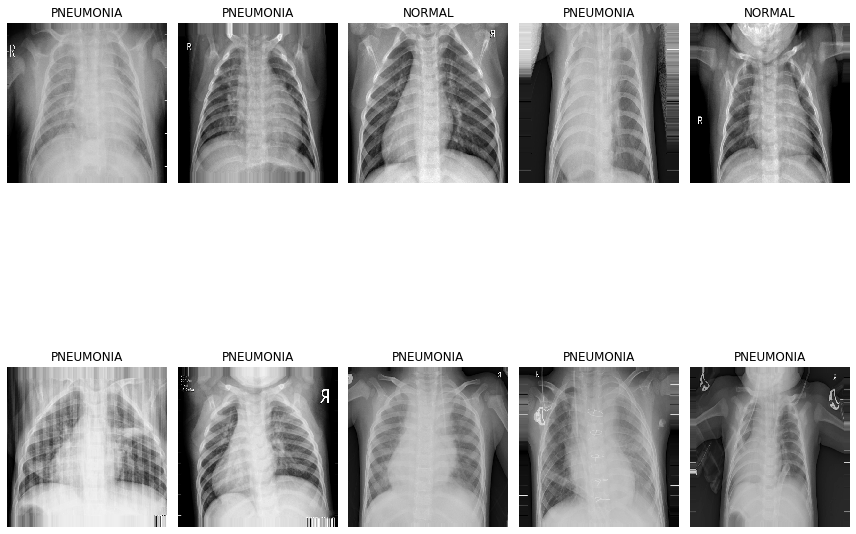

In [ ]:
plt.figure(figsize=(12, 12))
for i in range(0, 10):
    plt.subplot(2, 5, i+1)
    for X_batch, Y_batch in train:
        image = X_batch[0]        
        dic = {0:'NORMAL', 1:'PNEUMONIA'}
        plt.title(dic.get(Y_batch[0]))
        plt.axis('off')
        plt.imshow(np.squeeze(image),cmap='gray',interpolation='nearest')
        break
plt.tight_layout()
plt.show()

# AlexNet-1

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau, TensorBoard
%load_ext tensorboard
from tensorflow_addons.metrics import F1Score
import sklearn

In [ ]:
alexnet1 = Sequential()
alexnet1.add(Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
alexnet1.add(MaxPooling2D(pool_size = (2, 2)))
alexnet1.add(Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
alexnet1.add(MaxPooling2D(pool_size = (2, 2)))
alexnet1.add(Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
alexnet1.add(Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
alexnet1.add(Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
alexnet1.add(MaxPooling2D(pool_size = (2, 2)))
alexnet1.add(Flatten())
alexnet1.add(Dense(activation = 'relu', units = 128))
alexnet1.add(Dense(activation = 'relu', units = 64))
alexnet1.add(Dense(activation = 'sigmoid', units = 1))
alexnet1.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = [tf.keras.metrics.AUC(name='AUC'),'accuracy', tfa.metrics.F1Score(num_classes=1,name='f1')])
alexnet1.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 498, 498, 32)      320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 249, 249, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 247, 247, 32)      9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 123, 123, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 121, 121, 32)      9248      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 119, 119, 64)      18496     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 117, 117, 64)      3

In [ ]:
# Hyperparameters of Conv2D
Conv2D(filters=32, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu', input_shape=(500, 500, 1))
# Hyperparameters of MaxPooling2D 
MaxPooling2D(pool_size=(2, 2), strides=(2,2), padding='valid')

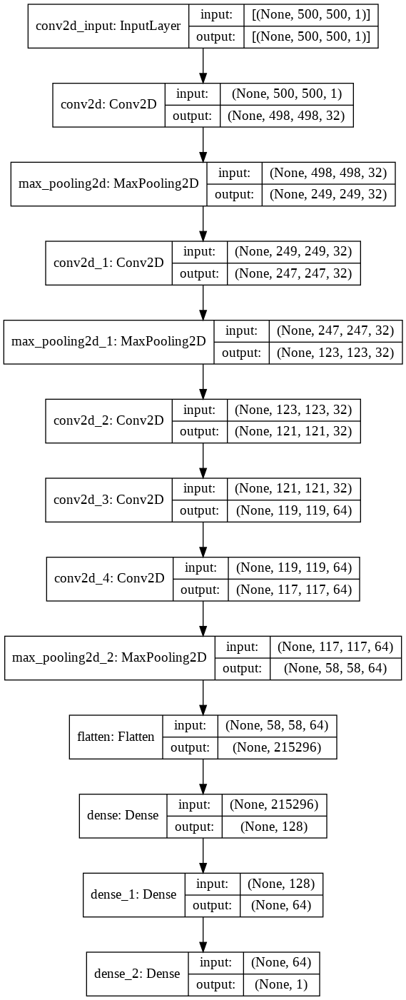

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(alexnet1,show_shapes=True, show_layer_names=True, rankdir='TB', expand_nested=True)

In [ ]:
early = EarlyStopping(monitor="val_loss", mode="min", patience=3)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', patience = 2, verbose=1,factor=0.3, min_lr=0.00001)
callbacks_list = [early, learning_rate_reduction, TensorBoard(log_dir="logs/AlexNet_1/")]

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
weights = compute_class_weight('balanced', np.unique(train.classes), train.classes)
cw = dict(zip( np.unique(train.classes), weights))
print(cw)

NameError: ignored

In [ ]:
alexnet1.fit(train,epochs=10, validation_data=valid, class_weight=cw, callbacks=callbacks_list)

Epoch 1/10
329/329 [==============================] - 2145s 7s/step - loss: 0.4324 - AUC: 0.8924 - accuracy: 0.8179 - f1: 0.8525 - val_loss: 0.5925 - val_AUC: 0.8750 - val_accuracy: 0.6875 - val_f1: 0.6667
Epoch 2/10
329/329 [==============================] - 2058s 6s/step - loss: 0.2871 - AUC: 0.9496 - accuracy: 0.8830 - f1: 0.8525 - val_loss: 0.4187 - val_AUC: 0.9062 - val_accuracy: 0.7500 - val_f1: 0.6667
Epoch 3/10
329/329 [==============================] - 2110s 6s/step - loss: 0.2467 - AUC: 0.9625 - accuracy: 0.9003 - f1: 0.8525 - val_loss: 0.3233 - val_AUC: 0.9453 - val_accuracy: 0.9375 - val_f1: 0.6667
Epoch 4/10
329/329 [==============================] - 2121s 6s/step - loss: 0.2175 - AUC: 0.9704 - accuracy: 0.9104 - f1: 0.8525 - val_loss: 0.6391 - val_AUC: 0.9062 - val_accuracy: 0.8125 - val_f1: 0.6667
Epoch 5/10
329/329 [==============================] - 2071s 6s/step - loss: 0.2035 - AUC: 0.9744 - accuracy: 0.9170 - f1: 0.8525 - val_loss: 0.5518 - val_AUC: 0.9375 - val_accu

In [ ]:
pd.Series({k:v[-1] for k, v in alexnet1.history.history.items()})

loss               0.150526
AUC                0.985072
accuracy           0.940449
f1               [0.852527]
val_loss           0.470861
val_AUC            0.890625
val_accuracy          0.875
val_f1          [0.6666667]
lr                   0.0003
dtype: object

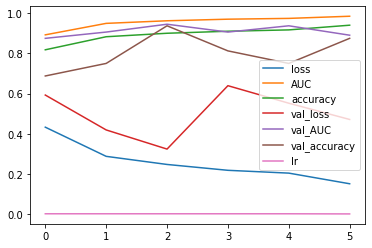

In [ ]:
pd.DataFrame(alexnet1.history.history).plot()

In [ ]:
test_accu = alexnet1.evaluate(test)
print('The testing accuracy is :',test_accu[1]*100, '%')

39/39 [==============================] - 117s 3s/step - loss: 0.2308 - AUC: 0.9702 - accuracy: 0.9071 - f1: 0.7692
The testing accuracy is : 97.01621532440186 %


In [ ]:
preds = alexnet1.predict(test,verbose=1)

39/39 [==============================] - 64s 2s/step


In [ ]:
predictions = preds.copy()
predictions[predictions <= 0.5] = 0
predictions[predictions > 0.5] = 1

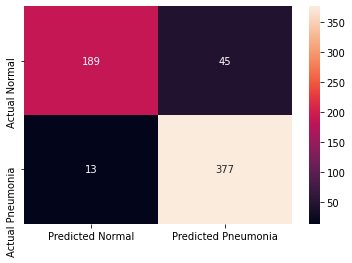

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
cm = pd.DataFrame(data=confusion_matrix(test.classes, predictions, labels=[0, 1]),index=["Actual Normal", "Actual Pneumonia"],
columns=["Predicted Normal", "Predicted Pneumonia"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d")

In [ ]:
print(classification_report(y_true=test.classes,y_pred=predictions,target_names =['NORMAL','PNEUMONIA']))

              precision    recall  f1-score   support

      NORMAL       0.94      0.81      0.87       234
   PNEUMONIA       0.89      0.97      0.93       390

    accuracy                           0.91       624
   macro avg       0.91      0.89      0.90       624
weighted avg       0.91      0.91      0.91       624



(624, 500, 500, 1)
(624,)


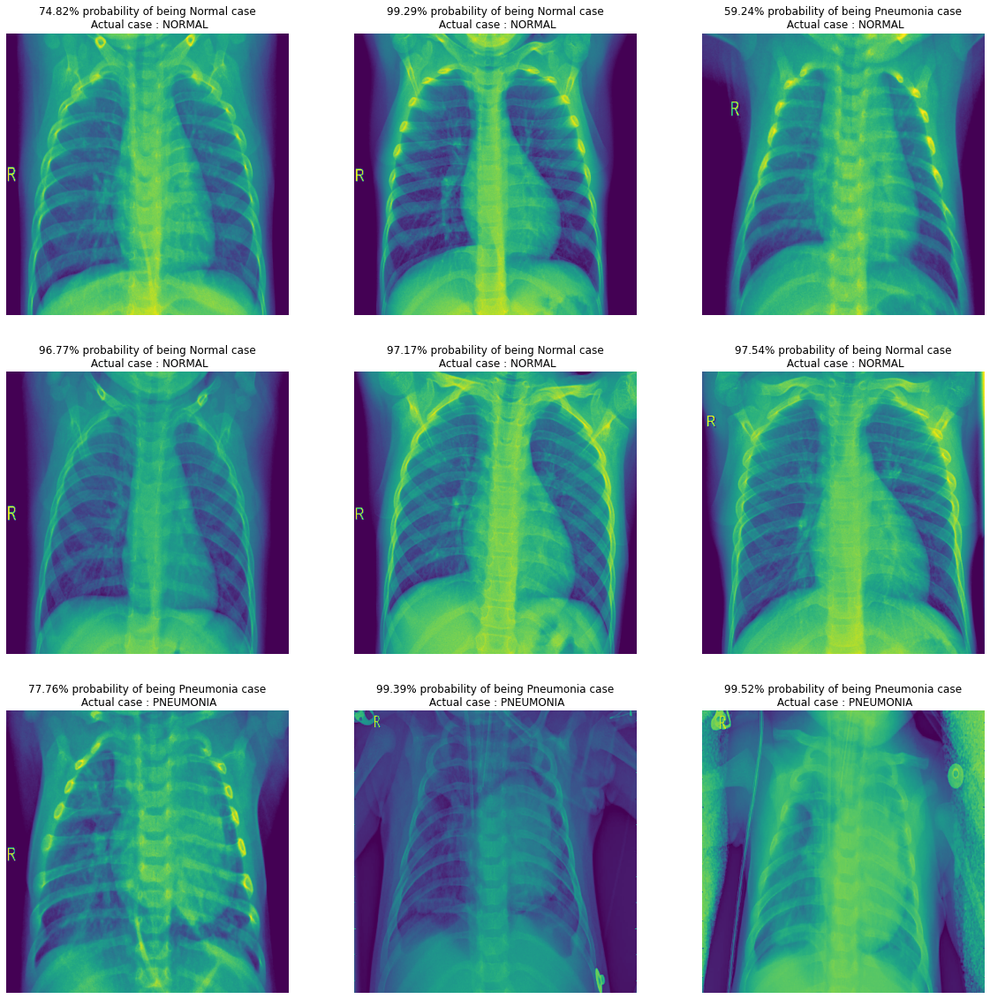

In [ ]:
test.reset()
x=np.concatenate([test.next()[0] for i in range(test.__len__())])
y=np.concatenate([test.next()[1] for i in range(test.__len__())])
print(x.shape)
print(y.shape)
#this little code above extracts the images from test Data iterator without shuffling the sequence
# x contains image array and y has labels 
dic = {0:'NORMAL', 1:'PNEUMONIA'}
plt.figure(figsize=(20,20))
for i in range(0+228, 9+228):
  plt.subplot(3, 3, (i-228)+1)
  if preds[i, 0] >= 0.5: 
      out = ('{:.2%} probability of being Pneumonia case'.format(preds[i][0]))
      
      
  else: 
      out = ('{:.2%} probability of being Normal case'.format(1-preds[i][0]))
  plt.title(out+"\n Actual case : "+ dic.get(y[i]))    
  plt.imshow(np.squeeze(x[i]))
  plt.axis('off')
plt.show()

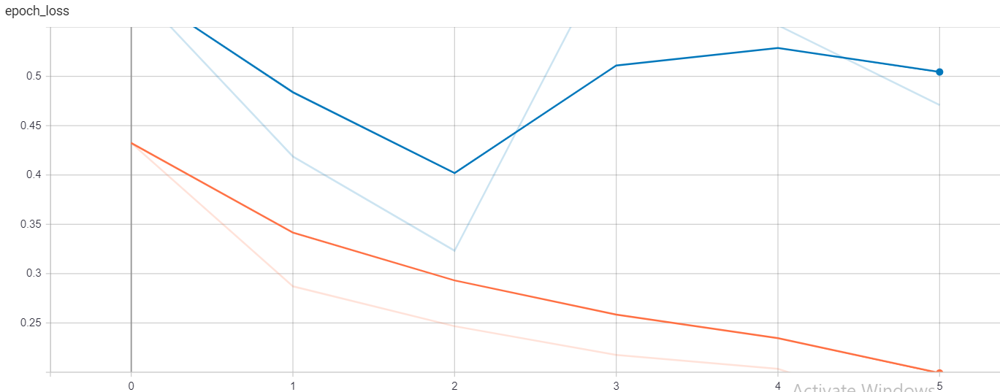

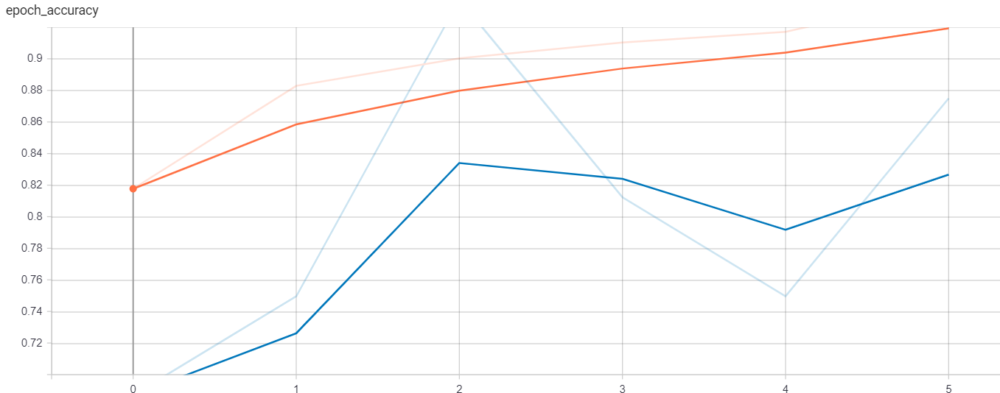

# AlexNet-2

In [ ]:
from tensorflow.keras.layers import Dropout, BatchNormalization

In [ ]:
alexnet2 = Sequential()
alexnet2.add(Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
alexnet2.add(BatchNormalization())
alexnet2.add(MaxPooling2D(pool_size = (2, 2)))
alexnet2.add(Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
alexnet2.add(BatchNormalization())
alexnet2.add(MaxPooling2D(pool_size = (2, 2)))
alexnet2.add(Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
alexnet2.add(BatchNormalization())
alexnet2.add(Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
alexnet2.add(BatchNormalization())
alexnet2.add(Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
alexnet2.add(BatchNormalization())
alexnet2.add(MaxPooling2D(pool_size = (2, 2)))
alexnet2.add(Flatten())
alexnet2.add(Dense(activation = 'relu', units = 128))
alexnet2.add(Dropout(0.2))
alexnet2.add(Dense(activation = 'relu', units = 64))
alexnet2.add(Dropout(0.2))
alexnet2.add(Dense(activation = 'sigmoid', units = 1))
alexnet2.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = [tf.keras.metrics.AUC(name='AUC'),'accuracy', tfa.metrics.F1Score(num_classes=1,name='f1')])
alexnet2.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 498, 498, 32)      320       
_________________________________________________________________
batch_normalization (BatchNo (None, 498, 498, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 249, 249, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 247, 247, 32)      9248      
_________________________________________________________________
batch_normalization_1 (Batch (None, 247, 247, 32)      128       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 123, 123, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 121, 121, 32)      9

In [ ]:
early = EarlyStopping(monitor="val_loss", mode="min", patience=3)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', patience = 2, verbose=1,factor=0.3, min_lr=0.00001)
callbacks_list = [early, learning_rate_reduction, TensorBoard(log_dir="logs/AlexNet_2")]

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
weights = compute_class_weight('balanced', np.unique(train.classes), train.classes)
cw = dict(zip( np.unique(train.classes), weights))
print(cw)

{0: 1.9452257586972612, 1: 0.6729833546734956}


In [ ]:
alexnet2.fit(train,epochs=12, validation_data=valid, class_weight=cw, callbacks=callbacks_list)

Epoch 1/12
329/329 [==============================] - 2852s 9s/step - loss: 5.7383 - AUC: 0.7930 - accuracy: 0.7751 - f1: 0.8741 - val_loss: 110.0778 - val_AUC: 0.5000 - val_accuracy: 0.5000 - val_f1: 0.6667
Epoch 2/12
329/329 [==============================] - 2708s 8s/step - loss: 1.5644 - AUC: 0.8911 - accuracy: 0.8445 - f1: 0.8813 - val_loss: 12.3045 - val_AUC: 0.6875 - val_accuracy: 0.6875 - val_f1: 0.6667
Epoch 3/12
329/329 [==============================] - 2780s 8s/step - loss: 0.6586 - AUC: 0.9204 - accuracy: 0.8732 - f1: 0.8632 - val_loss: 4.4381 - val_AUC: 0.6875 - val_accuracy: 0.5625 - val_f1: 0.6667
Epoch 4/12
329/329 [==============================] - 2772s 8s/step - loss: 0.6248 - AUC: 0.9143 - accuracy: 0.8778 - f1: 0.8620 - val_loss: 25.8061 - val_AUC: 0.5000 - val_accuracy: 0.5000 - val_f1: 0.0000e+00
Epoch 5/12
329/329 [==============================] - 2763s 8s/step - loss: 0.5032 - AUC: 0.9235 - accuracy: 0.8084 - f1: 0.8632 - val_loss: 29.1869 - val_AUC: 0.5625 -

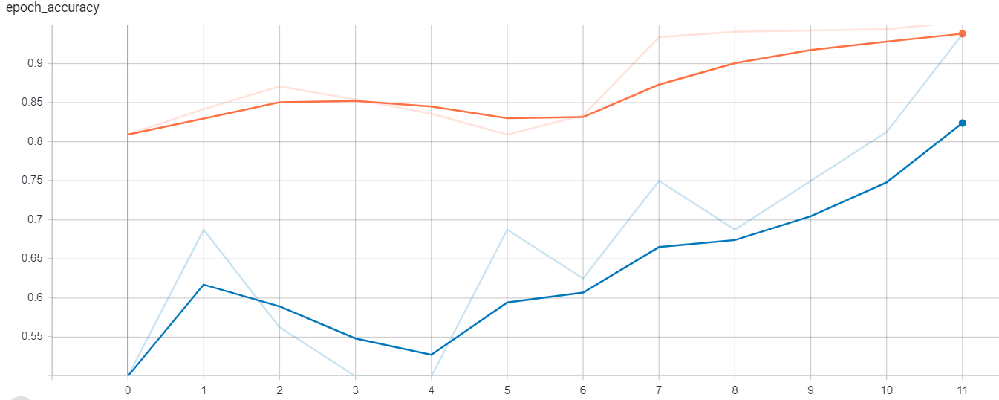

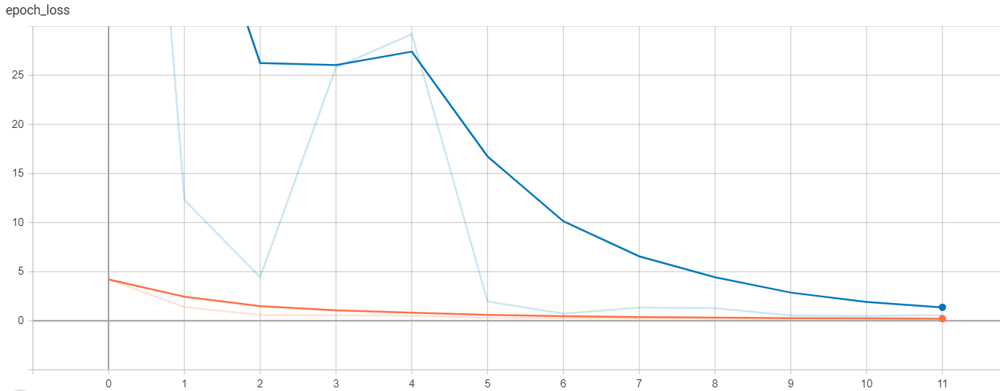

In [ ]:
pd.Series({k:v[-1] for k, v in alexnet2.history.history.items()})

loss               0.170386
AUC                0.983334
accuracy           0.953387
f1              [0.8548598]
val_loss            0.56162
val_AUC             0.90625
val_accuracy         0.9375
val_f1          [0.6666667]
lr                    9e-05
dtype: object

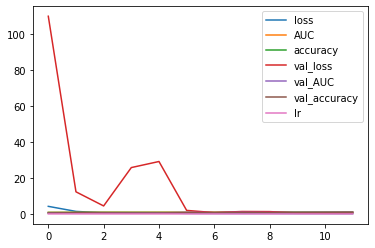

In [ ]:
pd.DataFrame(alexnet2.history.history).plot()

In [ ]:
preds = alexnet2.predict(test,verbose=1)

39/39 [==============================] - 110s 3s/step


In [ ]:
predictions = preds.copy()
predictions[predictions <= 0.5] = 0
predictions[predictions > 0.5] = 1

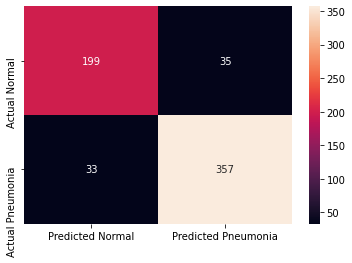

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
cm = pd.DataFrame(data=confusion_matrix(test.classes, predictions, labels=[0, 1]),index=["Actual Normal", "Actual Pneumonia"],
columns=["Predicted Normal", "Predicted Pneumonia"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d")

In [ ]:
print(classification_report(y_true=test.classes,y_pred=predictions,target_names =['NORMAL','PNEUMONIA']))

              precision    recall  f1-score   support

      NORMAL       0.86      0.85      0.85       234
   PNEUMONIA       0.91      0.92      0.91       390

    accuracy                           0.89       624
   macro avg       0.88      0.88      0.88       624
weighted avg       0.89      0.89      0.89       624



(624, 500, 500, 1)
(624,)


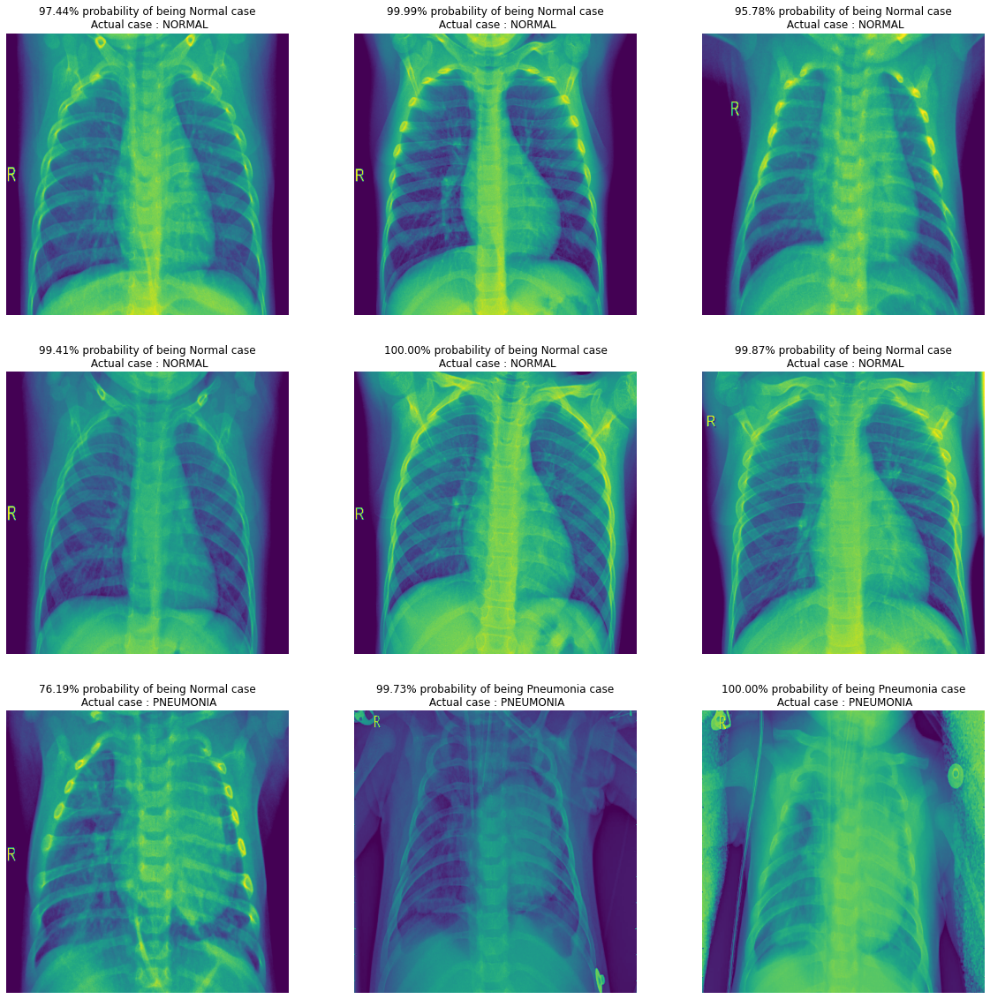

In [ ]:
test.reset()
x=np.concatenate([test.next()[0] for i in range(test.__len__())])
y=np.concatenate([test.next()[1] for i in range(test.__len__())])
print(x.shape)
print(y.shape)
#this little code above extracts the images from test Data iterator without shuffling the sequence
# x contains image array and y has labels 
dic = {0:'NORMAL', 1:'PNEUMONIA'}
plt.figure(figsize=(20,20))
for i in range(0+228, 9+228):
  plt.subplot(3, 3, (i-228)+1)
  if preds[i, 0] >= 0.5: 
      out = ('{:.2%} probability of being Pneumonia case'.format(preds[i][0]))
      
      
  else: 
      out = ('{:.2%} probability of being Normal case'.format(1-preds[i][0]))
  plt.title(out+"\n Actual case : "+ dic.get(y[i]))    
  plt.imshow(np.squeeze(x[i]))
  plt.axis('off')
plt.show()

# VGG-1

In [ ]:
vgg1 = Sequential()
vgg1.add(Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg1.add(BatchNormalization())
vgg1.add(Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg1.add(BatchNormalization())
vgg1.add(MaxPooling2D(pool_size = (2, 2)))
vgg1.add(Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg1.add(BatchNormalization())
vgg1.add(Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg1.add(BatchNormalization())
vgg1.add(MaxPooling2D(pool_size = (2, 2)))
vgg1.add(Conv2D(128, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg1.add(BatchNormalization())
vgg1.add(Conv2D(128, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg1.add(BatchNormalization())
vgg1.add(MaxPooling2D(pool_size = (2, 2)))
vgg1.add(Flatten())
vgg1.add(Dense(activation = 'relu', units = 128))
vgg1.add(Dropout(0.2))
vgg1.add(Dense(activation = 'sigmoid', units = 1))
vgg1.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = [tf.keras.metrics.AUC(name='AUC'),'accuracy', tfa.metrics.F1Score(num_classes=1,name='f1')])
vgg1.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 498, 498, 32)      320       
_________________________________________________________________
batch_normalization (BatchNo (None, 498, 498, 32)      128       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 496, 496, 32)      9248      
_________________________________________________________________
batch_normalization_1 (Batch (None, 496, 496, 32)      128       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 248, 248, 32)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 246, 246, 64)      18496     
_________________________________________________________________
batch_normalization_2 (Batch (None, 246, 246, 64)      2

In [ ]:
early = EarlyStopping(monitor="val_loss", mode="min", patience=3)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', patience = 2, verbose=1,factor=0.3, min_lr=0.00001)
callbacks_list = [early, learning_rate_reduction, TensorBoard(log_dir="logs/VGG_1")]

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
weights = compute_class_weight('balanced', np.unique(train.classes), train.classes)
cw = dict(zip( np.unique(train.classes), weights))
print(cw)

{0: 1.9452257586972612, 1: 0.6729833546734956}


In [ ]:
vgg1.fit(train,epochs=12, validation_data=valid, class_weight=cw, callbacks=callbacks_list)

Epoch 1/12
329/329 [==============================] - 1310s 4s/step - loss: 1.9765 - AUC: 0.9201 - accuracy: 0.8623 - f1: 0.8679 - val_loss: 90.8480 - val_AUC: 0.5000 - val_accuracy: 0.5000 - val_f1: 0.6667
Epoch 2/12
329/329 [==============================] - 168s 510ms/step - loss: 0.4173 - AUC: 0.9504 - accuracy: 0.9030 - f1: 0.8537 - val_loss: 0.5487 - val_AUC: 0.8906 - val_accuracy: 0.8125 - val_f1: 0.6667
Epoch 3/12
329/329 [==============================] - 172s 521ms/step - loss: 0.6278 - AUC: 0.9430 - accuracy: 0.8971 - f1: 0.8532 - val_loss: 170.5673 - val_AUC: 0.5000 - val_accuracy: 0.5000 - val_f1: 0.2000
Epoch 4/12
329/329 [==============================] - 169s 513ms/step - loss: 0.5350 - AUC: 0.9400 - accuracy: 0.8914 - f1: 0.8525 - val_loss: 6.1892 - val_AUC: 0.5625 - val_accuracy: 0.5000 - val_f1: 0.6957

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
Epoch 5/12
329/329 [==============================] - 167s 508ms/step - loss: 0.2610 -

In [ ]:
pd.Series({k:v[-1] for k, v in vgg1.history.history.items()})

loss               0.261043
AUC                0.973774
accuracy            0.93417
f1              [0.8525879]
val_loss            2.21014
val_AUC               0.875
val_accuracy            0.5
val_f1          [0.6666667]
lr                   0.0003
dtype: object

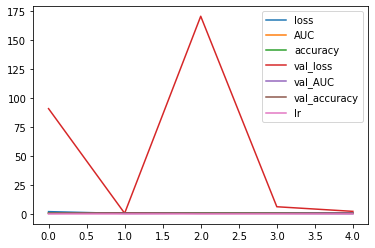

In [ ]:
pd.DataFrame(vgg1.history.history).plot()

In [ ]:
preds = vgg1.predict(test,verbose=1)

39/39 [==============================] - 146s 4s/step


In [ ]:
predictions = preds.copy()
predictions[predictions <= 0.5] = 0
predictions[predictions > 0.5] = 1

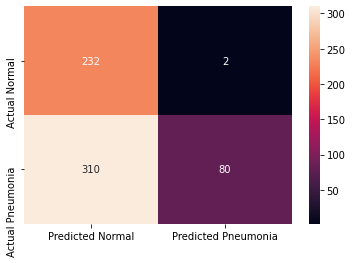

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
cm = pd.DataFrame(data=confusion_matrix(test.classes, predictions, labels=[0, 1]),index=["Actual Normal", "Actual Pneumonia"],
columns=["Predicted Normal", "Predicted Pneumonia"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d")

In [ ]:
print(classification_report(y_true=test.classes,y_pred=predictions,target_names =['NORMAL','PNEUMONIA']))

              precision    recall  f1-score   support

      NORMAL       0.43      0.99      0.60       234
   PNEUMONIA       0.98      0.21      0.34       390

    accuracy                           0.50       624
   macro avg       0.70      0.60      0.47       624
weighted avg       0.77      0.50      0.44       624



(624, 500, 500, 1)
(624,)


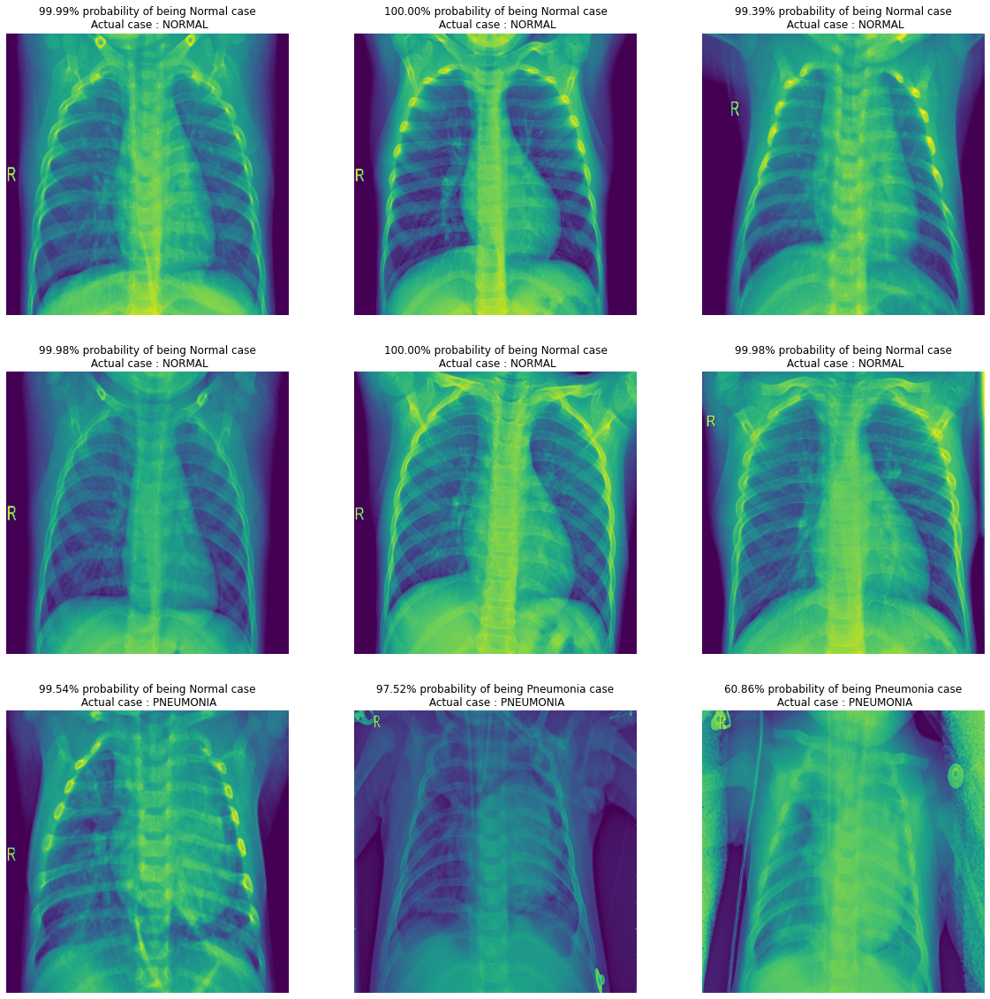

In [ ]:
test.reset()
x=np.concatenate([test.next()[0] for i in range(test.__len__())])
y=np.concatenate([test.next()[1] for i in range(test.__len__())])
print(x.shape)
print(y.shape)
#this little code above extracts the images from test Data iterator without shuffling the sequence
# x contains image array and y has labels 
dic = {0:'NORMAL', 1:'PNEUMONIA'}
plt.figure(figsize=(20,20))
for i in range(0+228, 9+228):
  plt.subplot(3, 3, (i-228)+1)
  if preds[i, 0] >= 0.5: 
      out = ('{:.2%} probability of being Pneumonia case'.format(preds[i][0]))
      
      
  else: 
      out = ('{:.2%} probability of being Normal case'.format(1-preds[i][0]))
  plt.title(out+"\n Actual case : "+ dic.get(y[i]))    
  plt.imshow(np.squeeze(x[i]))
  plt.axis('off')
plt.show()

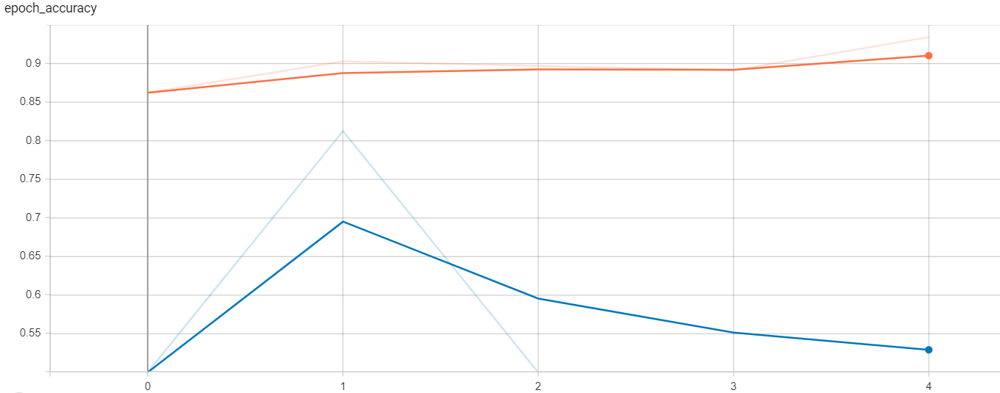

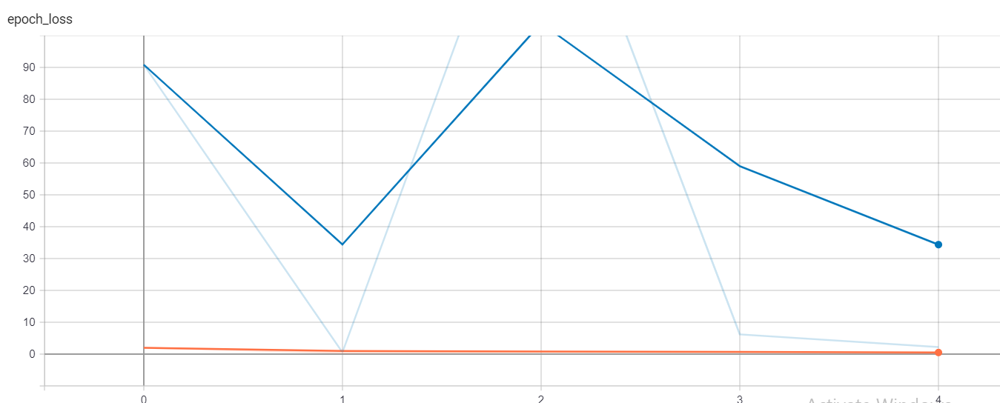

# VGG-2

In [ ]:
from tensorflow.keras.layers import AveragePooling2D

In [ ]:
vgg2 = Sequential()
vgg2.add(Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg2.add(BatchNormalization())
vgg2.add(Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg2.add(BatchNormalization())
vgg2.add(MaxPooling2D(pool_size = (2, 2)))
vgg2.add(Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg2.add(BatchNormalization())
vgg2.add(Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg2.add(BatchNormalization())
vgg2.add(MaxPooling2D(pool_size = (2, 2)))
vgg2.add(Conv2D(128, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg2.add(BatchNormalization())
vgg2.add(Conv2D(128, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)))
vgg2.add(BatchNormalization())
vgg2.add(AveragePooling2D((2, 2), strides=(2,2)))
vgg2.add(Flatten())
vgg2.add(Dense(activation = 'relu', units = 128))
vgg2.add(Dropout(0.2))
vgg2.add(Dense(activation = 'relu', units = 64))
vgg2.add(Dropout(0.2))
vgg2.add(Dense(activation = 'sigmoid', units = 1))
vgg2.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = [tf.keras.metrics.AUC(name='AUC'),'accuracy', tfa.metrics.F1Score(num_classes=1,name='f1')])
vgg2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 498, 498, 32)      320       
_________________________________________________________________
batch_normalization_6 (Batch (None, 498, 498, 32)      128       
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 496, 496, 32)      9248      
_________________________________________________________________
batch_normalization_7 (Batch (None, 496, 496, 32)      128       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 248, 248, 32)      0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 246, 246, 64)      18496     
_________________________________________________________________
batch_normalization_8 (Batch (None, 246, 246, 64)     

In [ ]:
early = EarlyStopping(monitor="val_loss", mode="min", patience=3)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', patience = 2, verbose=1,factor=0.3, min_lr=0.00001)
callbacks_list = [early, learning_rate_reduction, TensorBoard(log_dir="logs/VGG_2")]

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
weights = compute_class_weight('balanced', np.unique(train.classes), train.classes)
cw = dict(zip( np.unique(train.classes), weights))
print(cw)

{0: 1.9452257586972612, 1: 0.6729833546734956}


In [ ]:
vgg2.fit(train,epochs=15, validation_data=valid, class_weight=cw, callbacks=callbacks_list)

Epoch 1/15
329/329 [==============================] - 168s 509ms/step - loss: 5.6880 - AUC: 0.8250 - accuracy: 0.8052 - f1: 0.8883 - val_loss: 112.8441 - val_AUC: 0.5000 - val_accuracy: 0.5000 - val_f1: 0.6667
Epoch 2/15
329/329 [==============================] - 167s 508ms/step - loss: 1.3292 - AUC: 0.8691 - accuracy: 0.7500 - f1: 0.8647 - val_loss: 6.7084 - val_AUC: 0.6250 - val_accuracy: 0.6250 - val_f1: 0.6957
Epoch 3/15
329/329 [==============================] - 169s 512ms/step - loss: 0.6862 - AUC: 0.8890 - accuracy: 0.7390 - f1: 0.8604 - val_loss: 0.4592 - val_AUC: 0.9375 - val_accuracy: 0.8125 - val_f1: 0.6667
Epoch 4/15
329/329 [==============================] - 169s 513ms/step - loss: 0.6173 - AUC: 0.8826 - accuracy: 0.6421 - f1: 0.8570 - val_loss: 1.5482 - val_AUC: 0.9375 - val_accuracy: 0.5000 - val_f1: 0.7619
Epoch 5/15
329/329 [==============================] - 168s 509ms/step - loss: 0.6676 - AUC: 0.8742 - accuracy: 0.6558 - f1: 0.8552 - val_loss: 2123.0698 - val_AUC: 0.

In [ ]:
pd.Series({k:v[-1] for k, v in vgg2.history.history.items()})

loss                 0.43914
AUC                 0.885956
accuracy            0.877473
f1               [0.8570173]
val_loss            0.537189
val_AUC              0.84375
val_accuracy            0.75
val_f1          [0.72727275]
lr                    0.0003
dtype: object

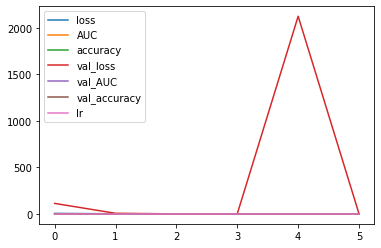

In [ ]:
pd.DataFrame(vgg2.history.history).plot()

In [ ]:
preds = vgg2.predict(test,verbose=1)

39/39 [==============================] - 7s 170ms/step


In [ ]:
predictions = preds.copy()
predictions[predictions <= 0.5] = 0
predictions[predictions > 0.5] = 1

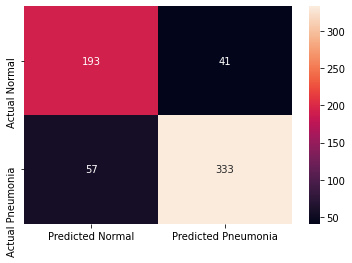

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
cm = pd.DataFrame(data=confusion_matrix(test.classes, predictions, labels=[0, 1]),index=["Actual Normal", "Actual Pneumonia"],
columns=["Predicted Normal", "Predicted Pneumonia"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d")

In [ ]:
print(classification_report(y_true=test.classes,y_pred=predictions,target_names =['NORMAL','PNEUMONIA']))

              precision    recall  f1-score   support

      NORMAL       0.77      0.82      0.80       234
   PNEUMONIA       0.89      0.85      0.87       390

    accuracy                           0.84       624
   macro avg       0.83      0.84      0.83       624
weighted avg       0.85      0.84      0.84       624



(624, 500, 500, 1)
(624,)


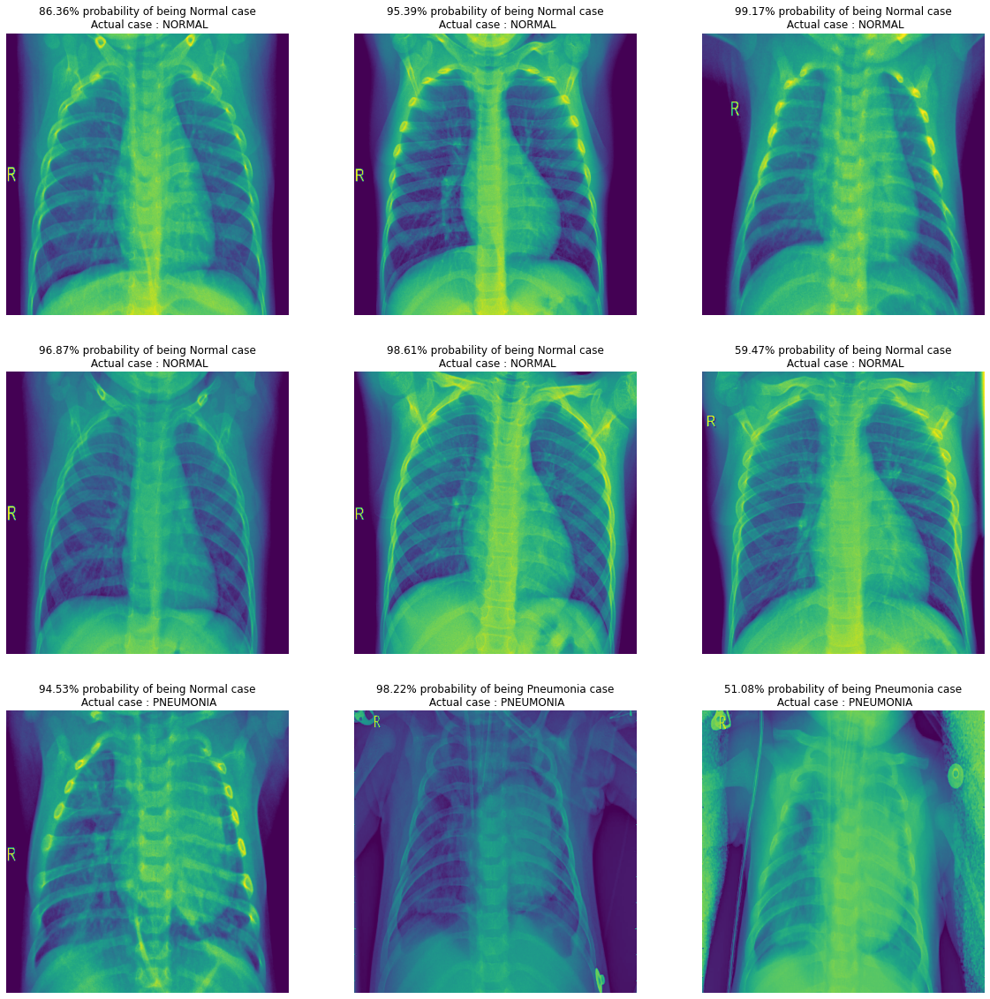

In [ ]:
test.reset()
x=np.concatenate([test.next()[0] for i in range(test.__len__())])
y=np.concatenate([test.next()[1] for i in range(test.__len__())])
print(x.shape)
print(y.shape)
#this little code above extracts the images from test Data iterator without shuffling the sequence
# x contains image array and y has labels 
dic = {0:'NORMAL', 1:'PNEUMONIA'}
plt.figure(figsize=(20,20))
for i in range(0+228, 9+228):
  plt.subplot(3, 3, (i-228)+1)
  if preds[i, 0] >= 0.5: 
      out = ('{:.2%} probability of being Pneumonia case'.format(preds[i][0]))
      
      
  else: 
      out = ('{:.2%} probability of being Normal case'.format(1-preds[i][0]))
  plt.title(out+"\n Actual case : "+ dic.get(y[i]))    
  plt.imshow(np.squeeze(x[i]))
  plt.axis('off')
plt.show()

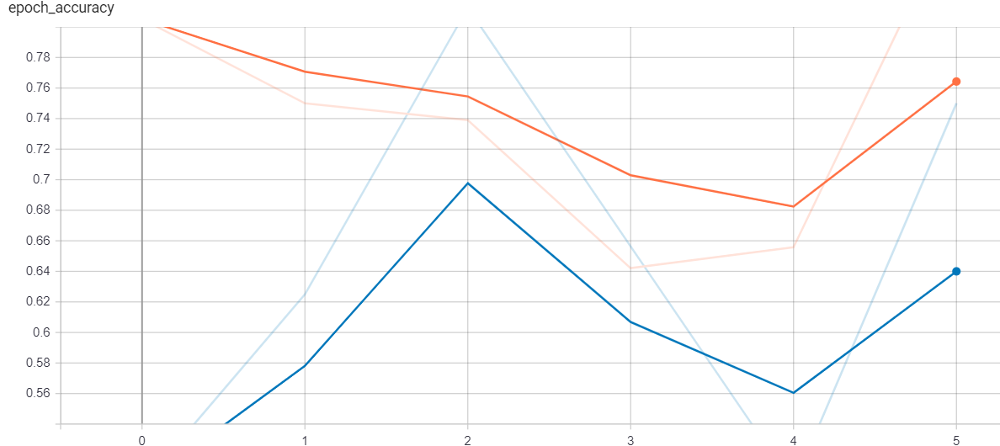

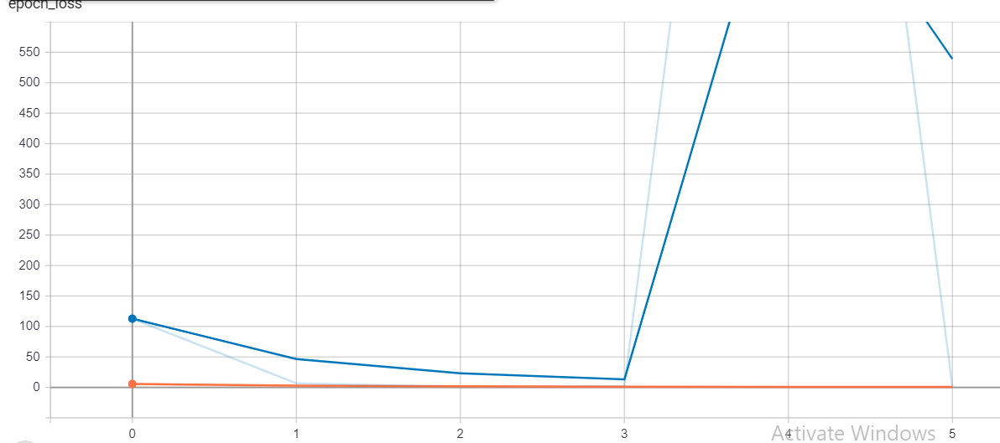

# AugNet-1

In [ ]:
from tensorflow.keras import Input, layers
SEED=123

In [ ]:
data_augmentation = Sequential([
  layers.experimental.preprocessing.RandomZoom(0.1, seed=SEED),
  layers.experimental.preprocessing.RandomRotation(0.1, seed=SEED),
  layers.experimental.preprocessing.RandomContrast(0.2, seed=SEED)
  ],
  name='RandomAugmentator'
)

In [ ]:
augnet1 = Sequential(
    [
     Input((500, 500, 1)),
     data_augmentation,
     Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     MaxPooling2D(pool_size = (2, 2)),

     Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     MaxPooling2D(pool_size = (2, 2)),

     Conv2D(128, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     Conv2D(128, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     AveragePooling2D((2, 2), strides=(2,2)),

     Flatten(),
     Dense(activation = 'relu', units = 128),
     Dropout(0.2),
     Dense(activation = 'sigmoid', units = 1)
    ],
    name="AugNet_1"
)

augnet1.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = [tf.keras.metrics.AUC(name='AUC'),'accuracy', tfa.metrics.F1Score(num_classes=1,name='f1')])
augnet1.summary()

Model: "AugNet_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
RandomAugmentator (Sequentia (None, 500, 500, 1)       0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 498, 498, 32)      320       
_________________________________________________________________
batch_normalization_12 (Batc (None, 498, 498, 32)      128       
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 496, 496, 32)      9248      
_________________________________________________________________
batch_normalization_13 (Batc (None, 496, 496, 32)      128       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 248, 248, 32)      0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 246, 246, 64)      184

In [ ]:
early = EarlyStopping(monitor="val_loss", mode="min", patience=3)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', patience = 2, verbose=1,factor=0.3, min_lr=0.00001)
callbacks_list = [early, learning_rate_reduction, TensorBoard(log_dir="logs/AugNet_1")]

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
weights = compute_class_weight('balanced', np.unique(train.classes), train.classes)
cw = dict(zip( np.unique(train.classes), weights))
print(cw)

{0: 1.9452257586972612, 1: 0.6729833546734956}


In [ ]:
augnet1.fit(train,epochs=200, validation_data=valid, class_weight=cw, callbacks=callbacks_list)

Epoch 1/200
329/329 [==============================] - 170s 513ms/step - loss: 9.0786 - AUC: 0.7765 - accuracy: 0.7129 - f1: 0.8477 - val_loss: 131.0008 - val_AUC: 0.5000 - val_accuracy: 0.5000 - val_f1: 0.6667
Epoch 2/200
329/329 [==============================] - 167s 507ms/step - loss: 0.6778 - AUC: 0.8711 - accuracy: 0.8317 - f1: 0.8546 - val_loss: 30.0608 - val_AUC: 0.6250 - val_accuracy: 0.5000 - val_f1: 0.6667
Epoch 3/200
329/329 [==============================] - 168s 510ms/step - loss: 0.4091 - AUC: 0.9293 - accuracy: 0.8685 - f1: 0.8496 - val_loss: 26.5309 - val_AUC: 0.4375 - val_accuracy: 0.4375 - val_f1: 0.5714
Epoch 4/200
329/329 [==============================] - 169s 514ms/step - loss: 0.3416 - AUC: 0.9476 - accuracy: 0.8894 - f1: 0.8502 - val_loss: 6.0709 - val_AUC: 0.6094 - val_accuracy: 0.6250 - val_f1: 0.6667
Epoch 5/200
329/329 [==============================] - 169s 512ms/step - loss: 0.5213 - AUC: 0.9246 - accuracy: 0.8693 - f1: 0.8520 - val_loss: 6.4161 - val_AUC

In [ ]:
pd.Series({k:v[-1] for k, v in augnet1.history.history.items()})

loss               0.196111
AUC                0.977489
accuracy           0.931697
f1               [0.852527]
val_loss           0.616157
val_AUC                0.75
val_accuracy          0.625
val_f1          [0.6666667]
lr                    9e-05
dtype: object

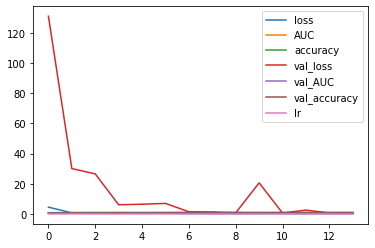

In [ ]:
pd.DataFrame(augnet1.history.history).plot()

In [ ]:
preds = augnet1.predict(test,verbose=1)

39/39 [==============================] - 7s 166ms/step


In [ ]:
predictions = preds.copy()
predictions[predictions <= 0.5] = 0
predictions[predictions > 0.5] = 1

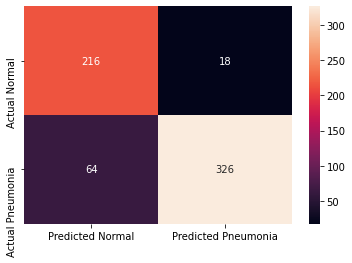

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
cm = pd.DataFrame(data=confusion_matrix(test.classes, predictions, labels=[0, 1]),index=["Actual Normal", "Actual Pneumonia"],
columns=["Predicted Normal", "Predicted Pneumonia"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d")

In [ ]:
print(classification_report(y_true=test.classes,y_pred=predictions,target_names =['NORMAL','PNEUMONIA']))

              precision    recall  f1-score   support

      NORMAL       0.77      0.92      0.84       234
   PNEUMONIA       0.95      0.84      0.89       390

    accuracy                           0.87       624
   macro avg       0.86      0.88      0.86       624
weighted avg       0.88      0.87      0.87       624



(624, 500, 500, 1)
(624,)


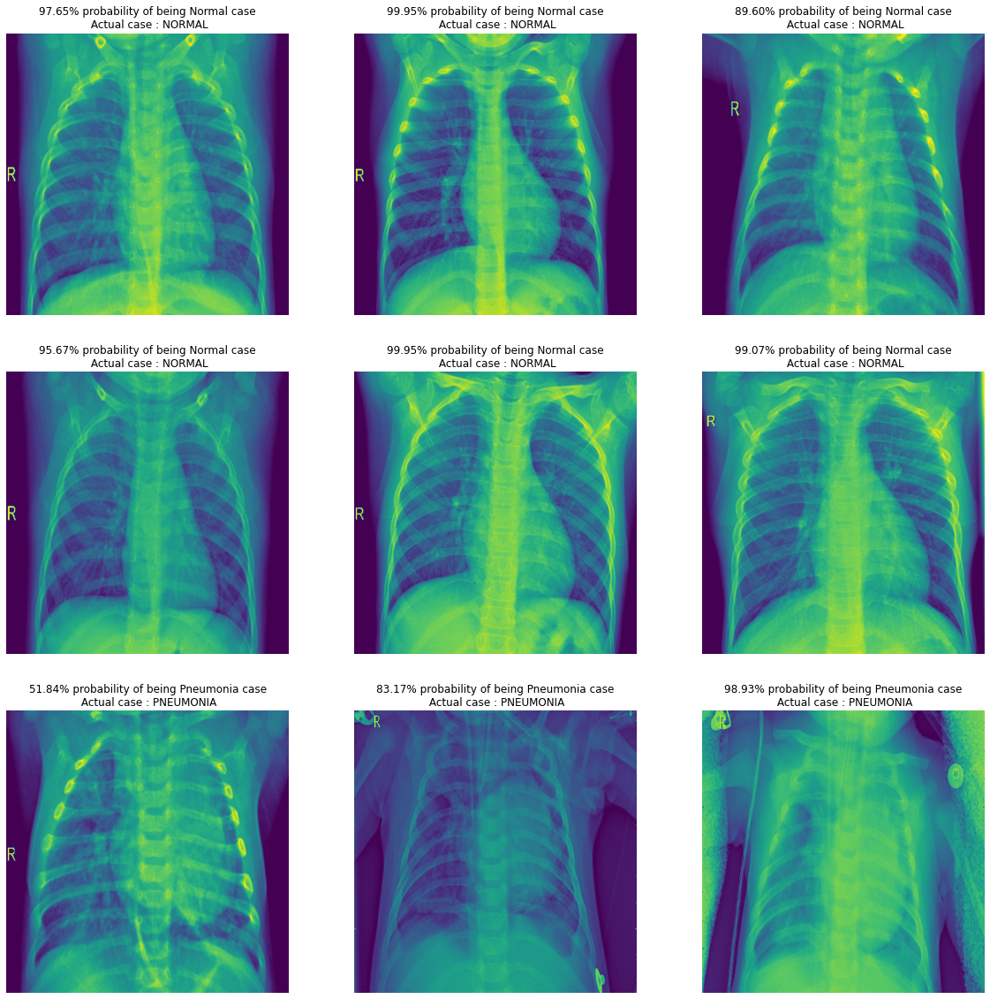

In [ ]:
test.reset()
x=np.concatenate([test.next()[0] for i in range(test.__len__())])
y=np.concatenate([test.next()[1] for i in range(test.__len__())])
print(x.shape)
print(y.shape)
#this little code above extracts the images from test Data iterator without shuffling the sequence
# x contains image array and y has labels 
dic = {0:'NORMAL', 1:'PNEUMONIA'}
plt.figure(figsize=(20,20))
for i in range(0+228, 9+228):
  plt.subplot(3, 3, (i-228)+1)
  if preds[i, 0] >= 0.5: 
      out = ('{:.2%} probability of being Pneumonia case'.format(preds[i][0]))
      
      
  else: 
      out = ('{:.2%} probability of being Normal case'.format(1-preds[i][0]))
  plt.title(out+"\n Actual case : "+ dic.get(y[i]))    
  plt.imshow(np.squeeze(x[i]))
  plt.axis('off')
plt.show()

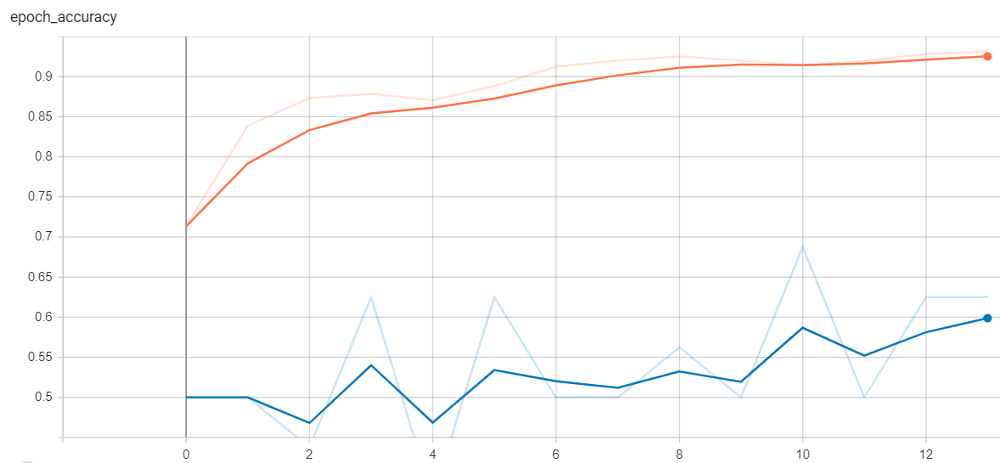

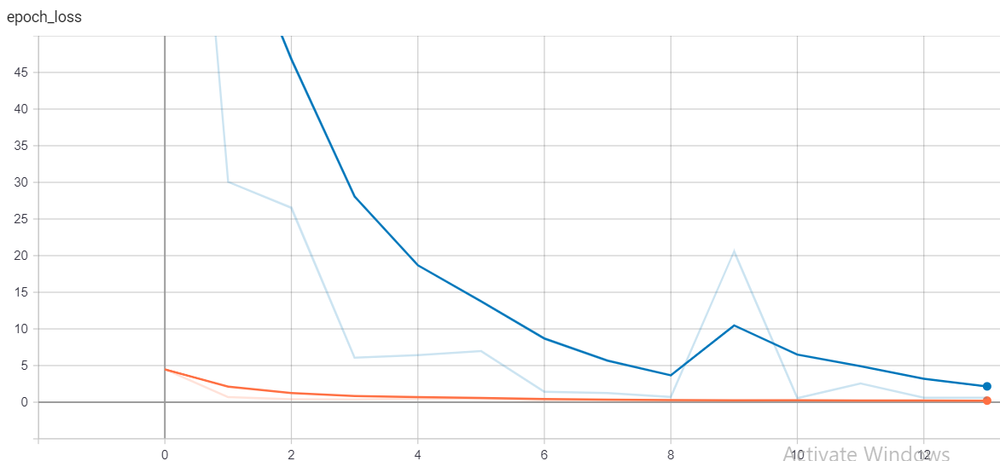

# AugNet-2

In [ ]:
augnet2 = Sequential(
    [
     Input((500, 500, 1)),
     data_augmentation,
     Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     Conv2D(32, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     MaxPooling2D(pool_size = (2, 2)),
     Dropout(0.2),

     Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     Conv2D(64, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     MaxPooling2D(pool_size = (2, 2)),
     Dropout(0.3),

     Conv2D(128, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     Conv2D(128, (3, 3), activation="relu", input_shape=(img_width, img_height, 1)),
     BatchNormalization(),
     AveragePooling2D((2, 2), strides=(2,2)),
     Dropout(0.4),

     Flatten(),
     Dense(activation = 'relu', units = 128),
     Dropout(0.4),
     Dense(activation = 'sigmoid', units = 1)
    ],
    name="AugNet_2"
)

augnet2.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = [tf.keras.metrics.AUC(name='AUC'),'accuracy', tfa.metrics.F1Score(num_classes=1,name='f1')])
augnet2.summary()

Model: "AugNet_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
RandomAugmentator (Sequentia (None, 500, 500, 1)       0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 498, 498, 32)      320       
_________________________________________________________________
batch_normalization_24 (Batc (None, 498, 498, 32)      128       
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 496, 496, 32)      9248      
_________________________________________________________________
batch_normalization_25 (Batc (None, 496, 496, 32)      128       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 248, 248, 32)      0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 248, 248, 32)      0  

In [ ]:
early = EarlyStopping(monitor="val_loss", mode="min", patience=3)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', patience = 3, verbose=1,factor=0.3, min_lr=0.00001)
callbacks_list = [early, learning_rate_reduction, TensorBoard(log_dir="logs/AugNet_2")]

In [ ]:
augnet2.fit(train,epochs=50, validation_data=valid, class_weight=cw, callbacks=callbacks_list)

Epoch 1/50
329/329 [==============================] - 171s 516ms/step - loss: 4.5767 - AUC: 0.7551 - accuracy: 0.6981 - f1: 0.8470 - val_loss: 89.7677 - val_AUC: 0.5000 - val_accuracy: 0.5000 - val_f1: 0.6316
Epoch 2/50
329/329 [==============================] - 168s 511ms/step - loss: 0.8018 - AUC: 0.8405 - accuracy: 0.5970 - f1: 0.8433 - val_loss: 4.8138 - val_AUC: 0.4141 - val_accuracy: 0.4375 - val_f1: 0.6667
Epoch 3/50
329/329 [==============================] - 168s 511ms/step - loss: 0.4637 - AUC: 0.8852 - accuracy: 0.7001 - f1: 0.8511 - val_loss: 2.9410 - val_AUC: 0.6875 - val_accuracy: 0.5000 - val_f1: 0.6667
Epoch 4/50
329/329 [==============================] - 169s 514ms/step - loss: 0.7036 - AUC: 0.8867 - accuracy: 0.7341 - f1: 0.8531 - val_loss: 13.9177 - val_AUC: 0.4297 - val_accuracy: 0.5000 - val_f1: 0.6000
Epoch 5/50
329/329 [==============================] - 169s 513ms/step - loss: 0.8001 - AUC: 0.8573 - accuracy: 0.6501 - f1: 0.8504 - val_loss: 0.8624 - val_AUC: 0.773

In [ ]:
pd.Series({k:v[-1] for k, v in augnet2.history.history.items()})

loss               0.360485
AUC                0.925934
accuracy           0.884132
f1               [0.852527]
val_loss            1.97999
val_AUC            0.804688
val_accuracy         0.4375
val_f1          [0.6666667]
lr                    0.001
dtype: object

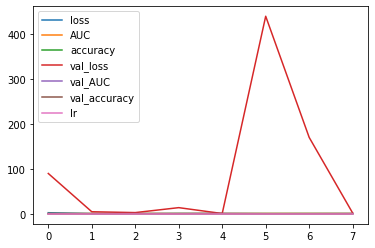

In [ ]:
pd.DataFrame(augnet2.history.history).plot()

In [ ]:
preds = augnet2.predict(test,verbose=1)

39/39 [==============================] - 7s 166ms/step


In [ ]:
predictions = preds.copy()
predictions[predictions <= 0.5] = 0
predictions[predictions > 0.5] = 1

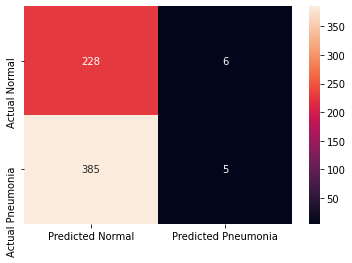

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
cm = pd.DataFrame(data=confusion_matrix(test.classes, predictions, labels=[0, 1]),index=["Actual Normal", "Actual Pneumonia"],
columns=["Predicted Normal", "Predicted Pneumonia"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d")

In [ ]:
print(classification_report(y_true=test.classes,y_pred=predictions,target_names =['NORMAL','PNEUMONIA']))

              precision    recall  f1-score   support

      NORMAL       0.37      0.97      0.54       234
   PNEUMONIA       0.45      0.01      0.02       390

    accuracy                           0.37       624
   macro avg       0.41      0.49      0.28       624
weighted avg       0.42      0.37      0.22       624



(624, 500, 500, 1)
(624,)


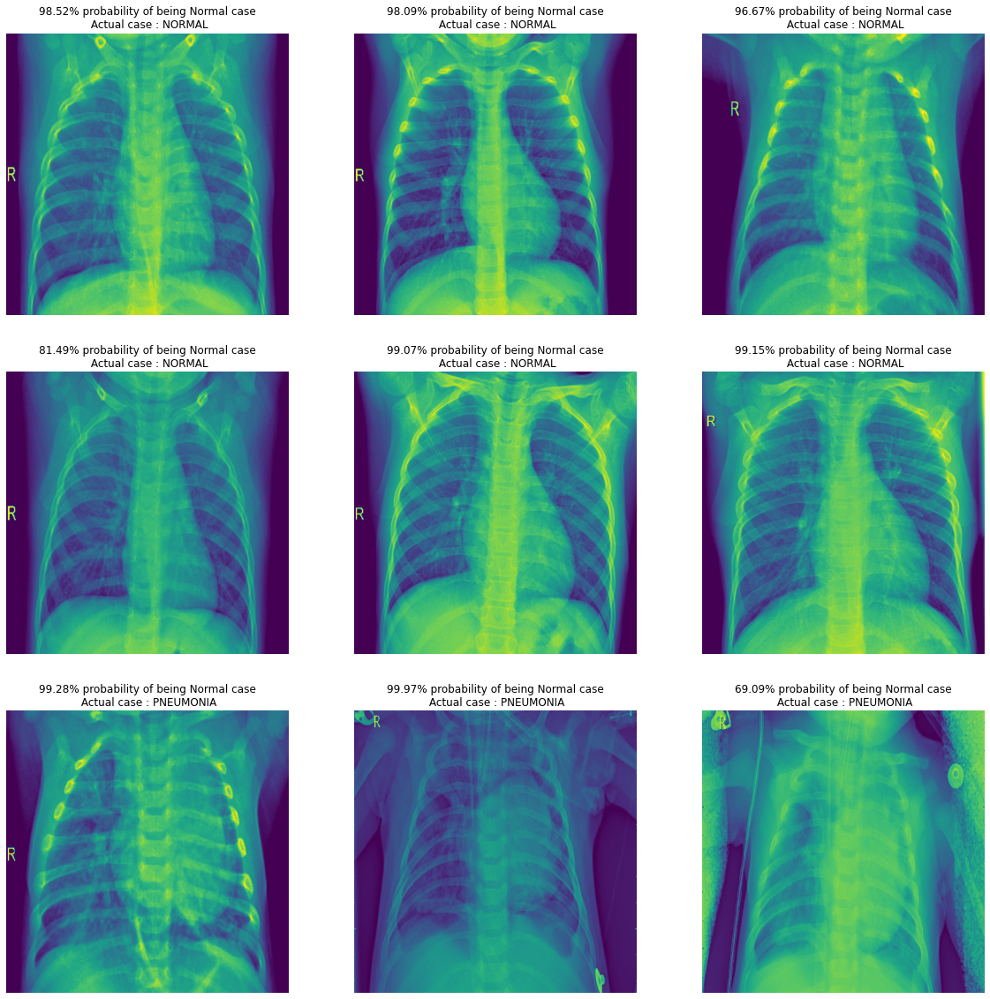

In [ ]:
test.reset()
x=np.concatenate([test.next()[0] for i in range(test.__len__())])
y=np.concatenate([test.next()[1] for i in range(test.__len__())])
print(x.shape)
print(y.shape)
#this little code above extracts the images from test Data iterator without shuffling the sequence
# x contains image array and y has labels 
dic = {0:'NORMAL', 1:'PNEUMONIA'}
plt.figure(figsize=(20,20))
for i in range(0+228, 9+228):
  plt.subplot(3, 3, (i-228)+1)
  if preds[i, 0] >= 0.5: 
      out = ('{:.2%} probability of being Pneumonia case'.format(preds[i][0]))
      
      
  else: 
      out = ('{:.2%} probability of being Normal case'.format(1-preds[i][0]))
  plt.title(out+"\n Actual case : "+ dic.get(y[i]))    
  plt.imshow(np.squeeze(x[i]))
  plt.axis('off')
plt.show()

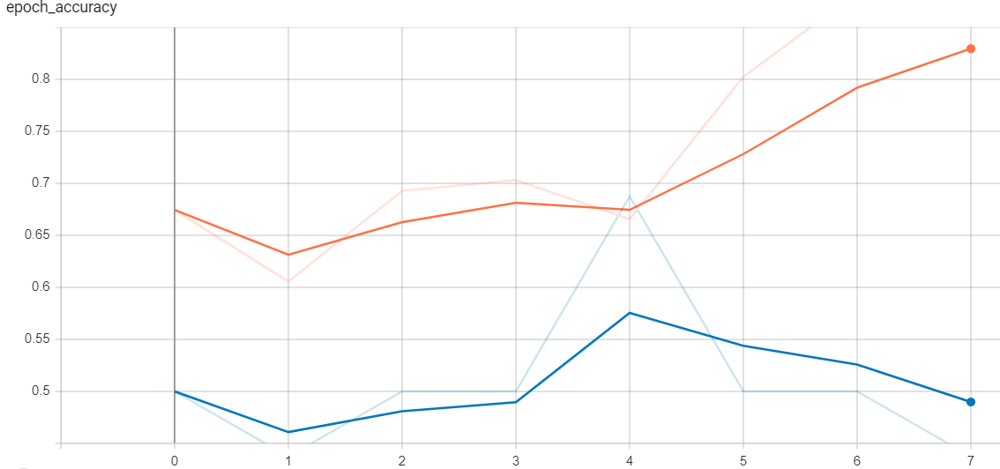

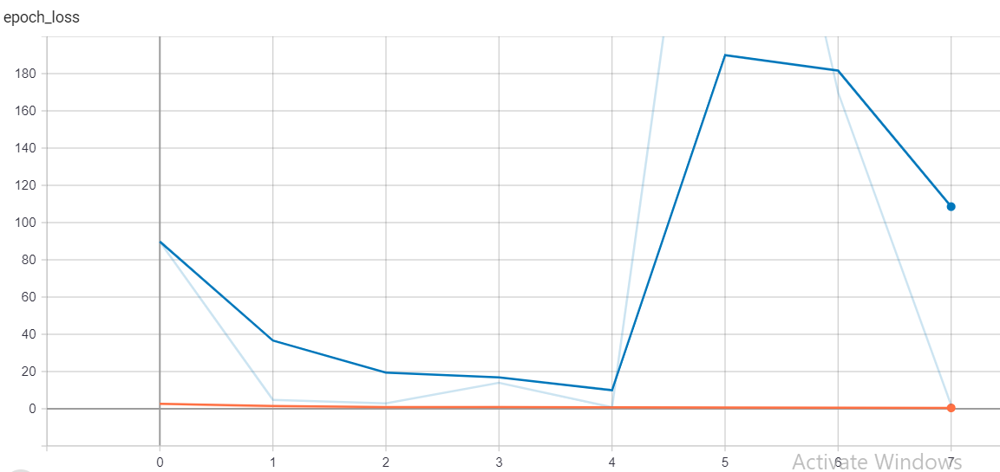

# Inception V3

In [ ]:
path='/content/drive/MyDrive/dataset1/data_/'
test_path='/content/drive/MyDrive/dataset1/test_/'
batch_size = 16
img_height = 170
img_width = 260
image_gen = ImageDataGenerator(rescale = 1./255, shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True)
test_data_gen = ImageDataGenerator(rescale = 1./255)



In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
image_gen = ImageDataGenerator(
                                  rescale = 1./255,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True, 
                                  validation_split=0.2         
                               )
test_data_gen = ImageDataGenerator(rescale = 1./255)

In [ ]:
train = image_gen.flow_from_directory(path, class_mode='categorical', batch_size=batch_size, target_size=(img_height,img_width),
                                    color_mode='rgb', subset='training')

validation = image_gen.flow_from_directory(path, class_mode='categorical', batch_size=batch_size, target_size=(img_height,img_width),
                                          color_mode='rgb', subset='validation')
test = test_data_gen.flow_from_directory(
      test_path,
      target_size=(img_height, img_width),
      color_mode='rgb')

Found 192 images belonging to 1 classes.
Found 48 images belonging to 1 classes.
Found 60 images belonging to 1 classes.


In [ ]:
InceptionV3 = tf.keras.applications.InceptionV3(
    include_top=True,
    weights="imagenet",
    classifier_activation="softmax",
)

decode = tf.keras.applications.inception_v3.decode_predictions
scaling = tf.keras.applications.inception_v3.preprocess_input

image_preprocessor = Sequential(
  [
   layers.experimental.preprocessing.Resizing(299, 299, name="resizing"),
   layers.Activation(scaling, name='scaling')     
  ],
  name='ImagePreprocessor'
)

96116736/96112376 [==============================] - 1s 0us/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


40960/35363 [==================================] - 0s 0us/step


[[('n07753592', 'banana', 0.9999186),
  ('n07747607', 'orange', 7.309775e-06),
  ('n07716906', 'spaghetti_squash', 1.5792991e-06),
  ('n04548280', 'wall_clock', 1.2784212e-06),
  ('n02110958', 'pug', 7.2315095e-07)]]

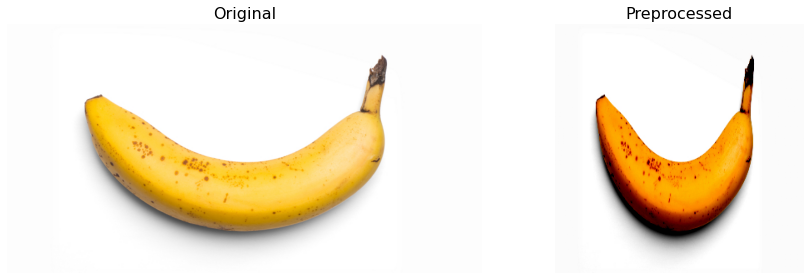

In [ ]:
from skimage.io import imread

img = imread('/content/drive/MyDrive/dataset1/data_/data/banana_26.jpg')
original_img=img
img = img[None, ...]
img = image_preprocessor(img)

fig, ax = plt.subplots(1, 2, figsize=(13, 4))
ax[0].imshow(original_img)
ax[1].imshow(img[0,...])
ax[0].set_title('Original', fontsize=16)
ax[1].set_title('Preprocessed', fontsize=16)
ax[0].axis('off'); ax[1].axis('off')
plt.tight_layout()

prediction = InceptionV3.predict(img)
decode(prediction)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n07749582', 'lemon', 0.84493285),
  ('n07747607', 'orange', 0.12849016),
  ('n07742313', 'Granny_Smith', 0.0011544243),
  ('n07734744', 'mushroom', 0.0010622506),
  ('n07753592', 'banana', 0.0006895308)]]

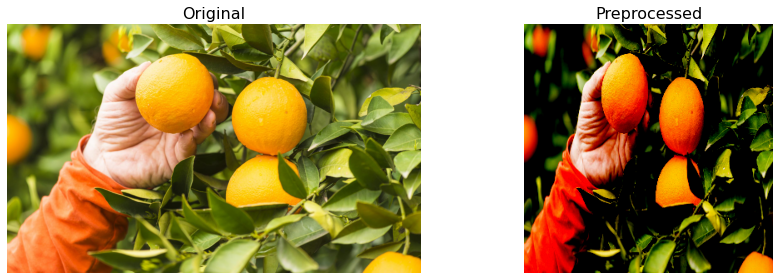

In [ ]:
from skimage.io import imread

img = imread('/content/drive/MyDrive/dataset1/data_/data/orange_21.jpg')
original_img=img
img = img[None, ...]
img = image_preprocessor(img)

fig, ax = plt.subplots(1, 2, figsize=(13, 4))
ax[0].imshow(original_img)
ax[1].imshow(img[0,...])
ax[0].set_title('Original', fontsize=16)
ax[1].set_title('Preprocessed', fontsize=16)
ax[0].axis('off'); ax[1].axis('off')
plt.tight_layout()

prediction = InceptionV3.predict(img)
decode(prediction)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03482405', 'hamper', 0.6110473),
  ('n04204238', 'shopping_basket', 0.18916388),
  ('n07768694', 'pomegranate', 0.027249355),
  ('n07753592', 'banana', 0.008867345),
  ('n07753275', 'pineapple', 0.0057733743)]]

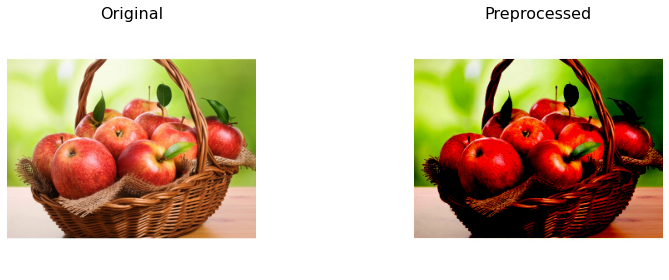

In [ ]:
from skimage.io import imread

img = imread('/content/drive/MyDrive/dataset1/data_/data/apple_60.jpg')
original_img=img
img = img[None, ...]
img = image_preprocessor(img)

fig, ax = plt.subplots(1, 2, figsize=(13, 4))
ax[0].imshow(original_img)
ax[1].imshow(img[0,...])
ax[0].set_title('Original', fontsize=16)
ax[1].set_title('Preprocessed', fontsize=16)
ax[0].axis('off'); ax[1].axis('off')
plt.tight_layout()

prediction = InceptionV3.predict(img)
decode(prediction)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n07753592', 'banana', 0.67810357),
  ('n07747607', 'orange', 0.13306479),
  ('n07742313', 'Granny_Smith', 0.093656),
  ('n03000134', 'chainlink_fence', 0.062491063),
  ('n07768694', 'pomegranate', 0.0038713685)]]

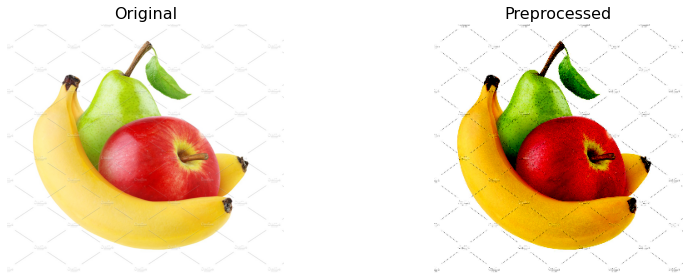

In [ ]:
from skimage.io import imread

img = imread('/content/drive/MyDrive/dataset1/data_/data/mixed_14.jpg')
original_img=img
img = img[None, ...]
img = image_preprocessor(img)

fig, ax = plt.subplots(1, 2, figsize=(13, 4))
ax[0].imshow(original_img)
ax[1].imshow(img[0,...])
ax[0].set_title('Original', fontsize=16)
ax[1].set_title('Preprocessed', fontsize=16)
ax[0].axis('off'); ax[1].axis('off')
plt.tight_layout()

prediction = InceptionV3.predict(img)
decode(prediction)

# Transfer Learning

In [ ]:
inception_layers = InceptionV3.layers
inception_layers.pop()

for layer in inception_layers:
    layer.trainable = False

extractor = tf.keras.Model(inputs=InceptionV3.inputs, outputs=inception_layers[-1].output)
logit = Dense(100, activation='softmax', input_shape=(2048,))

c100_extractor = Sequential([
    layers.Activation(lambda x: tf.image.resize_with_pad(x, target_height=299, target_width=299)),
    image_preprocessor,
    extractor
])

In [ ]:
from tensorflow.keras.datasets.cifar100 import load_data
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

In [ ]:
(X_train, y_train), (X_test, y_test) = load_data()
# original dataset is splitted 5:1, so according to the task we should resplit it

X = np.vstack([X_train, X_test])
y = np.vstack([y_train, y_test])
n_classes = len(np.unique(y))
y = to_categorical(y)

X_train, X_val, y_train, y_val = \
                        train_test_split(X, y, test_size=0.2, random_state=SEED)

X_train.shape, X_val.shape, y_train.shape, y_val.shape

((48000, 32, 32, 3), (12000, 32, 32, 3), (48000, 100), (12000, 100))

In [ ]:
X_train_2 = c100_extractor.predict(X_train)
X_val_2 = c100_extractor.predict(X_val)

In [ ]:
logit = Sequential([logit])

logit.compile(
    optimizer='Adam', loss='categorical_crossentropy',
    metrics=[
      'accuracy',
      F1Score(100, average='macro', name='f1'),
      tf.keras.metrics.AUC(name='AUC')
    ]
)


history = logit.fit(X_train_2, y_train, epochs=100,
                        validation_data=(X_val_2, y_val),
                        callbacks = [tf.keras.callbacks.TensorBoard('./logs/c100')])
logit.save('models/c100_logit')

Epoch 1/100
1500/1500 [==============================] - 8s 5ms/step - loss: 2.2279 - accuracy: 0.4642 - f1: 0.4614 - AUC: 0.9288 - val_loss: 1.3674 - val_accuracy: 0.6256 - val_f1: 0.6243 - val_AUC: 0.9701
Epoch 2/100
1500/1500 [==============================] - 6s 4ms/step - loss: 1.1435 - accuracy: 0.6778 - f1: 0.6729 - AUC: 0.9800 - val_loss: 1.3396 - val_accuracy: 0.6351 - val_f1: 0.6360 - val_AUC: 0.9685
Epoch 3/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.9663 - accuracy: 0.7191 - f1: 0.7148 - AUC: 0.9850 - val_loss: 1.3496 - val_accuracy: 0.6439 - val_f1: 0.6367 - val_AUC: 0.9649
Epoch 4/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.8426 - accuracy: 0.7523 - f1: 0.7487 - AUC: 0.9880 - val_loss: 1.2978 - val_accuracy: 0.6578 - val_f1: 0.6540 - val_AUC: 0.9656
Epoch 5/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.7639 - accuracy: 0.7753 - f1: 0.7721 - AUC: 0.9902 - val_loss: 1.3303 - val_accuracy: 0.6559 

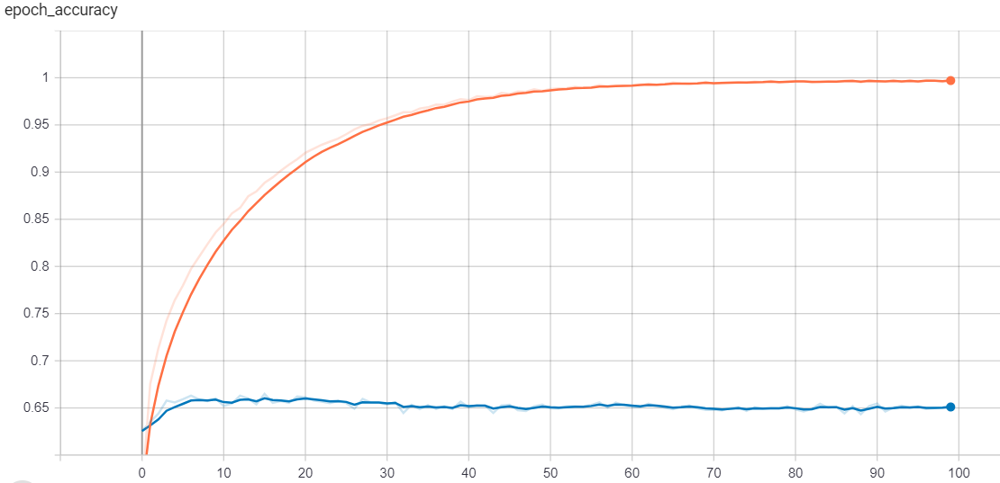

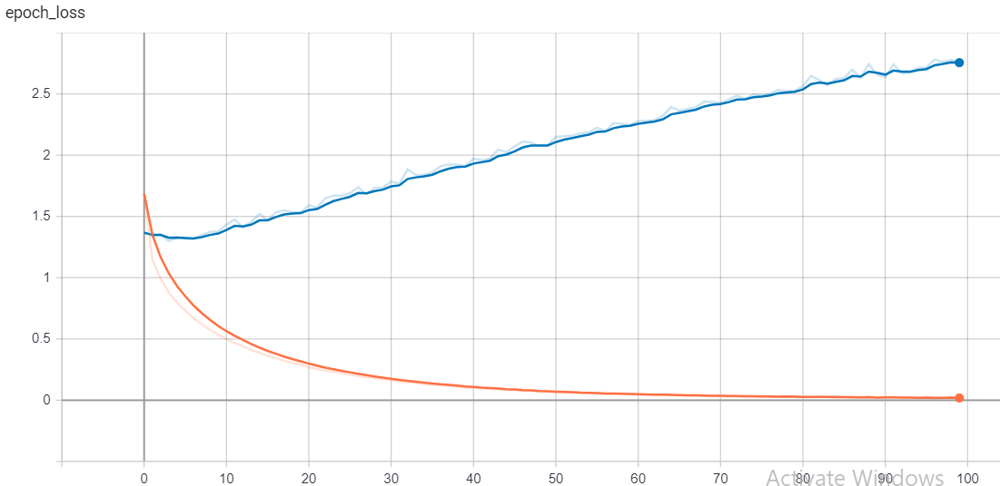